In [130]:
import numpy as np
import pandas as pd
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/gidataset/gidata/Auto-WCEBleedGen Challenge Test Dataset/Test Dataset 1/A0028.png
/kaggle/input/gidataset/gidata/Auto-WCEBleedGen Challenge Test Dataset/Test Dataset 1/A0016.png
/kaggle/input/gidataset/gidata/Auto-WCEBleedGen Challenge Test Dataset/Test Dataset 1/A0046.png
/kaggle/input/gidataset/gidata/Auto-WCEBleedGen Challenge Test Dataset/Test Dataset 1/A0041.png
/kaggle/input/gidataset/gidata/Auto-WCEBleedGen Challenge Test Dataset/Test Dataset 1/A0023.png
/kaggle/input/gidataset/gidata/Auto-WCEBleedGen Challenge Test Dataset/Test Dataset 1/A0042.png
/kaggle/input/gidataset/gidata/Auto-WCEBleedGen Challenge Test Dataset/Test Dataset 1/A0038.png
/kaggle/input/gidataset/gidata/Auto-WCEBleedGen Challenge Test Dataset/Test Dataset 1/A0007.png
/kaggle/input/gidataset/gidata/Auto-WCEBleedGen Challenge Test Dataset/Test Dataset 1/A0044.png
/kaggle/input/gidataset/gidata/Auto-WCEBleedGen Challenge Test Dataset/Test Dataset 1/A0002.png
/kaggle/input/gidataset/gidata/Auto-WCEB

In [131]:
import os
import cv2
import numpy as np

In [132]:
import matplotlib.pyplot as plt

# **PATH TO THE DATASET**

In [133]:
train_path = "/kaggle/input/gidataset/gidata/WCEBleedGen"
test_path1 = "/kaggle/input/gidataset/gidata/Auto-WCEBleedGen Challenge Test Dataset/Test Dataset 1"
test_path2="/kaggle/input/gidataset/gidata/Auto-WCEBleedGen Challenge Test Dataset/Test Dataset 2"

In [134]:
classes = os.listdir(train_path)
classes


['bleeding', 'non-bleeding']

In [135]:
!pip install --upgrade opencv-python


In [136]:
from tensorflow.keras import utils

In [137]:
import os
import cv2
import numpy as np

# Define the base path to the train dataset folder
base_folder = "/kaggle/input/gidataset/gidata/WCEBleedGen/"

# Define empty lists to store images, bounding boxes, and corresponding labels
train_data = []
train_bboxes = []  # To store bounding boxes
train_labels = []

# Define a function to parse bounding box data from a text file
def parse_bbox_file(bbox_filepath):
    # Initialize an empty list to store bounding boxes
    bounding_boxes = []
    
    with open(bbox_filepath, 'r') as file:
        for line in file:
            # Split the line into comma-separated values
            values = line.strip().split(',')
            
            if len(values) == 4:
                # Convert the values to integers (you can adjust this depending on your format)
                x, y, width, height = map(int, values)
                
                # Store the bounding box as a tuple (x, y, width, height)
                bounding_boxes.append((x, y, width, height))
    
    return bounding_boxes

# Define a function to recursively traverse directories and load images
def load_images_from_directory(directory, category):
    for filename in os.listdir(directory):
        filepath = os.path.join(directory, filename)
        
        # Check if the current item is a directory
        if os.path.isdir(filepath):
            # Recursively call the function for nested directories
            load_images_from_directory(filepath, category)
        else:
            # Check if the file is an image 
            if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
                # Load and preprocess the image
                image = cv2.imread(filepath)
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                image = cv2.resize(image, (100, 100))  
                
                # Append the image to the list
                train_data.append(image)
                train_labels.append(category)
                
                # Check for corresponding bounding box files (customize extensions)
                bbox_filename = os.path.splitext(filename)[0] + ".txt"
                bbox_filepath = os.path.join(directory, bbox_filename)
                if os.path.isfile(bbox_filepath):
                    # Parse the bounding box file and store the bounding box data
                    bounding_boxes = parse_bbox_file(bbox_filepath)
                else:
                    # If there are no bounding box annotations, use an empty list
                    bounding_boxes = []
                
                # Store the bounding boxes in the train_bboxes list
                train_bboxes.append(bounding_boxes)

# Iterate through top-level directories within the base folder
for category in os.listdir(base_folder):
    category_folder = os.path.join(base_folder, category)
    
    # Check if the current item is a directory
    if os.path.isdir(category_folder):
        # Recursively load images from nested directories
        load_images_from_directory(category_folder, category)

# Convert lists to NumPy arrays for further processing
X_train = np.array(train_data)
Y_train = np.array(train_labels)

# Convert the list of bounding boxes to a NumPy array if needed
train_bboxes = np.array(train_bboxes)


In [138]:
X_train=np.array(train_data)
Y_train=np.array(train_labels)

**CHECKING SHAPES OF THE TRAIN DATA**

In [139]:
X_train.shape

(5236, 100, 100, 3)

In [140]:
Y_train.shape

(5236,)

In [141]:
len(train_bboxes)

5236

# MODEL CREATION

In [142]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten
from tensorflow.keras.layers import Dense
from sklearn.model_selection import train_test_split

In [143]:
from sklearn.preprocessing import LabelEncoder
# Initialize the label encoder
label_encoder = LabelEncoder()

# Fit and transform the labels to integers
Y_train_encoded = label_encoder.fit_transform(Y_train)

# Split the data into training and validation sets (80% training, 20% validation)
X_train, X_val, Y_train_encoded, Y_val, bbox_train, bbox_val = train_test_split(
    X_train, Y_train_encoded, train_bboxes, test_size=0.2, random_state=42
)

# Defining neural network model
model = keras.Sequential([
    # Input layer: Flatten layer to preprocess the input images
    keras.layers.Flatten(input_shape=(100, 100, 3)),
    
    # First hidden layer: Dense layer with 128 units and ReLU activation
    keras.layers.Dense(128, activation='relu'),
    
    # Second hidden layer: Dense layer with 64 units and ReLU activation
    keras.layers.Dense(64, activation='relu'),
    
    # Third hidden layer: Dense layer with 32 units and ReLU activation
    keras.layers.Dense(32, activation='relu'),
    
    # Output layer: Dense layer with 10 units (assuming 10 classes) and softmax activation
    keras.layers.Dense(10, activation='softmax')
])

# Compile the model
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',  # Use 'categorical_crossentropy' for one-hot encoded labels
              metrics=['accuracy'])

# Train the model
history = model.fit(X_train, Y_train_encoded, epochs=50, validation_split=0.2)

Epoch 1/50
105/105 [==============================] - 4s 29ms/step - loss: 77.2751 - accuracy: 0.7660 - val_loss: 17.2040 - val_accuracy: 0.8377
Epoch 2/50
105/105 [==============================] - 3s 26ms/step - loss: 23.4647 - accuracy: 0.8394 - val_loss: 9.5298 - val_accuracy: 0.8962
Epoch 3/50
105/105 [==============================] - 3s 27ms/step - loss: 7.1211 - accuracy: 0.8955 - val_loss: 3.3296 - val_accuracy: 0.9021
Epoch 4/50
105/105 [==============================] - 3s 27ms/step - loss: 2.3633 - accuracy: 0.9400 - val_loss: 6.4372 - val_accuracy: 0.8831
Epoch 5/50
105/105 [==============================] - 3s 27ms/step - loss: 5.9824 - accuracy: 0.9167 - val_loss: 2.5824 - val_accuracy: 0.9379
Epoch 6/50
105/105 [==============================] - 3s 27ms/step - loss: 4.7917 - accuracy: 0.9197 - val_loss: 0.9668 - val_accuracy: 0.9642
Epoch 7/50
105/105 [==============================] - 3s 26ms/step - loss: 2.7339 - accuracy: 0.9424 - val_loss: 1.2961 - val_accuracy: 0.9

In [144]:
model.compile(optimizer="adam", loss="categorical_crossentropy", metrics=['accuracy'])

In [145]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_2 (Flatten)         (None, 30000)             0         
                                                                 
 dense_8 (Dense)             (None, 128)               3840128   
                                                                 
 dense_9 (Dense)             (None, 64)                8256      
                                                                 
 dense_10 (Dense)            (None, 32)                2080      
                                                                 
 dense_11 (Dense)            (None, 10)                330       
                                                                 
Total params: 3,850,794
Trainable params: 3,850,794
Non-trainable params: 0
_________________________________________________________________


In [146]:
# Save the trained model to a file
model.save("challenge.h5")

In [147]:
import os

# Get the current working directory
current_directory = os.getcwd()

# List the files in the current directory
files_in_directory = os.listdir(current_directory)

# Print the list of files in the current directory
print("Files in the current directory:")
for file_name in files_in_directory:
    print(file_name)


Files in the current directory:
predicted_results.csv
output_folder_bleeding_test_1
challenge.h5
output_folder_non_bleeding_test_2
output_folder_non_bleeding_test_1
.virtual_documents
predicted_results_with_patient_info_confidence_output.xlsx
predicted_results_with_patient_info_confidence-f.xlsx
output_folder_test_1
output_folder_test_2
output_folder_test
output_folder_bleeding_test_2


In [148]:
from tensorflow import keras

# Load the saved model
loaded_model = keras.models.load_model("/kaggle/working/challenge.h5")


In [149]:
import os
import cv2
import numpy as np
from tensorflow import keras

# Define the base paths to the two test dataset folders
test_base_folder_1 = "/kaggle/input/gidataset/gidata/Auto-WCEBleedGen Challenge Test Dataset/Test Dataset 1/"
test_base_folder_2 = "/kaggle/input/gidataset/gidata/Auto-WCEBleedGen Challenge Test Dataset/Test Dataset 2/"

# Define empty lists to store test images
test_data_1 = []
test_data_2 = []

# Define a function to recursively traverse directories and load test images
def load_test_images_from_directory(directory, data_list):
    for filename in os.listdir(directory):
        filepath = os.path.join(directory, filename)
        
        # Check if the file is an image (you can customize the extensions)
        if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
            # Load and preprocess the test image
            image = cv2.imread(filepath)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            image = cv2.resize(image, (100, 100))  # Adjust target size as needed
            
            # Append the test image to the list
            data_list.append(image)

# Load test images from test dataset 1
load_test_images_from_directory(test_base_folder_1, test_data_1)

# Load test images from test dataset 2
load_test_images_from_directory(test_base_folder_2, test_data_2)

# Convert the lists of test images to NumPy arrays
X_test_1 = np.array(test_data_1)
X_test_2 = np.array(test_data_2)

# Load the saved model
loaded_model = keras.models.load_model("/kaggle/working/challenge.h5")

# Use the loaded model to make predictions on test dataset 1
predictions_1 = loaded_model.predict(X_test_1)

# Use the loaded model to make predictions on test dataset 2
predictions_2 = loaded_model.predict(X_test_2)

17/17 [==============================] - 0s 6ms/step


In [150]:
# Define a threshold for binary classification
threshold = 0.5

# Make binary predictions for test dataset 1
binary_predictions_1 = (predictions_1 > threshold).astype(np.int32)

# Print the binary predictions for test dataset 1
print(binary_predictions_1)


[[0 1 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 0]
 [1 0 0 0 0

In [151]:
# Define a threshold for binary classification
threshold = 0.5

# Make binary predictions for test dataset 2
binary_predictions_2 = (predictions_2 > threshold).astype(np.int32)

# Print the binary predictions for test dataset 2
print(binary_predictions_2[:10, :10])  # Print the first 10 rows and 10 columns


[[0 1 0 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0]
 [1 0 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 0]]


In [152]:
import os

test_dataset_folder_1 = '/kaggle/input/gidataset/gidata/Auto-WCEBleedGen Challenge Test Dataset/Test Dataset 1'

# Get a list of filenames for all images in the directory
test_dataset_1_filenames = [filename for filename in os.listdir(test_dataset_folder_1) if filename.lower().endswith(('.jpg', '.jpeg', '.png'))]

# Iterate through the binary predictions and filenames
for i, row in enumerate(binary_predictions_1):
    filename = test_dataset_1_filenames[i]
    predicted_class = row[1]  
    
    if predicted_class == 1:
        print(f"Image {filename} is predicted as Bleeding.")
    else:
        print(f"Image {filename} is predicted as Non-Bleeding.")


Image A0028.png is predicted as Bleeding.
Image A0016.png is predicted as Bleeding.
Image A0046.png is predicted as Bleeding.
Image A0041.png is predicted as Bleeding.
Image A0023.png is predicted as Bleeding.
Image A0042.png is predicted as Non-Bleeding.
Image A0038.png is predicted as Bleeding.
Image A0007.png is predicted as Bleeding.
Image A0044.png is predicted as Bleeding.
Image A0002.png is predicted as Non-Bleeding.
Image A0040.png is predicted as Bleeding.
Image A0019.png is predicted as Non-Bleeding.
Image A0021.png is predicted as Bleeding.
Image A0037.png is predicted as Bleeding.
Image A0011.png is predicted as Non-Bleeding.
Image A0026.png is predicted as Bleeding.
Image A0008.png is predicted as Non-Bleeding.
Image A0035.png is predicted as Non-Bleeding.
Image A0017.png is predicted as Bleeding.
Image A0013.png is predicted as Non-Bleeding.
Image A0018.png is predicted as Bleeding.
Image A0012.png is predicted as Non-Bleeding.
Image A0029.png is predicted as Bleeding.
Im

In [154]:
import os

test_dataset_folder_2 = '/kaggle/input/gidataset/gidata/Auto-WCEBleedGen Challenge Test Dataset/Test Dataset 2'

# Get a list of filenames for all images in the directory
test_dataset_2_filenames = [filename for filename in os.listdir(test_dataset_folder_2) if filename.lower().endswith(('.jpg', '.jpeg', '.png'))]

# Iterate through the binary predictions and filenames
for i, row in enumerate(binary_predictions_2):
    filename = test_dataset_2_filenames[i]
    predicted_class = row[1] 
    
    if predicted_class == 1:
        print(f"Image {filename} is predicted as Bleeding.")
    else:
        print(f"Image {filename} is predicted as Non-Bleeding.")


Image A0388.png is predicted as Bleeding.
Image A0106.png is predicted as Non-Bleeding.
Image A0461.png is predicted as Bleeding.
Image A0213.png is predicted as Non-Bleeding.
Image A0473.png is predicted as Non-Bleeding.
Image A0273.png is predicted as Non-Bleeding.
Image A0458.png is predicted as Non-Bleeding.
Image A0128.png is predicted as Bleeding.
Image A0137.png is predicted as Non-Bleeding.
Image A0358.png is predicted as Bleeding.
Image A0551.png is predicted as Bleeding.
Image A0060.png is predicted as Non-Bleeding.
Image A0188.png is predicted as Non-Bleeding.
Image A0452.png is predicted as Non-Bleeding.
Image A0196.png is predicted as Non-Bleeding.
Image A0245.png is predicted as Non-Bleeding.
Image A0111.png is predicted as Non-Bleeding.
Image A0190.png is predicted as Non-Bleeding.
Image A0476.png is predicted as Bleeding.
Image A0136.png is predicted as Non-Bleeding.
Image A0057.png is predicted as Bleeding.
Image A0143.png is predicted as Non-Bleeding.
Image A0563.png 

In [155]:
import os
import cv2
import numpy as np
from tensorflow import keras

# Define the base paths to the two test dataset folders
test_base_folder_1 = "/kaggle/input/gidataset/gidata/Auto-WCEBleedGen Challenge Test Dataset/Test Dataset 1/"
test_base_folder_2 = "/kaggle/input/gidataset/gidata/Auto-WCEBleedGen Challenge Test Dataset/Test Dataset 2/"

# Define a function to recursively traverse directories and load test images
def load_test_images_from_directory(directory):
    test_data = []
    for filename in os.listdir(directory):
        filepath = os.path.join(directory, filename)
        
        # Check if the file is an image (you can customize the extensions)
        if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
            # Load and preprocess the test image
            image = cv2.imread(filepath)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            image = cv2.resize(image, (100, 100))  # Adjust target size as needed
            
            # Append the test image to the list
            test_data.append((filename, image))

    return test_data

# Load test images from test dataset 1
test_data_1 = load_test_images_from_directory(test_base_folder_1)

# Load test images from test dataset 2
test_data_2 = load_test_images_from_directory(test_base_folder_2)

# Load the saved model
loaded_model = keras.models.load_model("/kaggle/working/challenge.h5")

# Function to make predictions
def make_predictions(test_data):
    predictions = []
    for filename, image in test_data:
        # Preprocess the image
        image = image / 255.0  # Normalize pixel values to [0, 1]
        input_image = image.reshape((1, 100, 100, 3))
        
        # Make predictions using the loaded model
        predictions.append((filename, loaded_model.predict(input_image)))
    
    return predictions

# Make predictions for test dataset 1
predictions_1 = make_predictions(test_data_1)

# Make predictions for test dataset 2
predictions_2 = make_predictions(test_data_2)

1/1 [==============================] - 0s 24ms/step


In [156]:
import matplotlib.pyplot as plt

1/1 [==============================] - 0s 23ms/step


ValueError: too many values to unpack (expected 5)

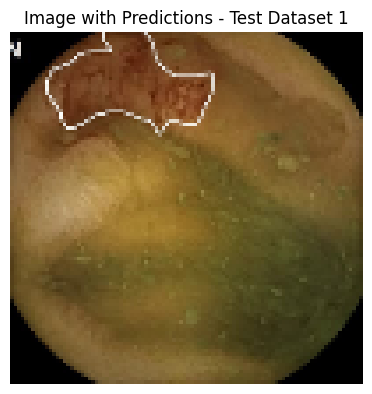

In [158]:
# Function to visualize predictions for a dataset
def visualize_predictions(images, predictions, dataset_name):
    for i, prediction in enumerate(predictions):
        filename, image = images[i]  # Extract the image and filename from the tuple
        
        # Preprocess the image (normalize pixel values to [0, 1] and reshape if needed)
        image = image / 255.0  # Normalize pixel values to [0, 1]
        input_image = image.reshape((1, 100, 100, 3))  # Reshape for model input

        # Make predictions using the loaded model
        predictions = loaded_model.predict(input_image)

        # Display the image with bounding boxes and class labels
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(image)
        plt.title(f"Image with Predictions - {dataset_name}")
        plt.axis('off')

        for (x1, y1, x2, y2, class_prob) in predictions:
            # Draw the bounding box on the image
            color = (0, 255, 0)  # Green color for the bounding box
            thickness = 2
            plt.rectangle([x1, y1], [x2, y2], color=color, thickness=thickness)

            # Get the predicted class label
            class_index = np.argmax(class_prob)
            predicted_class_label = class_labels[class_index]

            # Add the class label near the bounding box
            label_text = f"{predicted_class_label}: {class_prob[class_index]:.2f}"
            plt.text(x1, y1 - 10, label_text, color=color, fontsize=10)

        plt.show()
        
        
# Visualize predictions for test dataset 1
visualize_predictions(test_data_1, predictions_1, "Test Dataset 1")

# Visualize predictions for test dataset 2
visualize_predictions(test_data_2, predictions_2, "Test Dataset 2")


In [159]:
import os
import cv2
import numpy as np
from tensorflow import keras

# Define the base paths to the two test dataset folders
test_base_folder_1 = "/kaggle/input/gidataset/gidata/Auto-WCEBleedGen Challenge Test Dataset/Test Dataset 1/"
test_base_folder_2 = "/kaggle/input/gidataset/gidata/Auto-WCEBleedGen Challenge Test Dataset/Test Dataset 2/"

# Define empty lists to store test images and predictions for each dataset
test_data_1 = []
test_data_2 = []
predictions_1 = []
predictions_2 = []

# Define a function to recursively traverse directories and load test images
def load_test_images_from_directory(directory, data_list):
    for filename in os.listdir(directory):
        filepath = os.path.join(directory, filename)
        
        # Check if the file is an image (you can customize the extensions)
        if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
            # Load and preprocess the test image
            image = cv2.imread(filepath)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            image = cv2.resize(image, (100, 100))  # Adjust target size as needed
            
            # Append the test image to the list
            data_list.append(image)

# Load test images from test dataset 1
load_test_images_from_directory(test_base_folder_1, test_data_1)

# Load test images from test dataset 2
load_test_images_from_directory(test_base_folder_2, test_data_2)

# Convert the lists of test images to NumPy arrays
X_test_1 = np.array(test_data_1)
X_test_2 = np.array(test_data_2)

# Load the saved model
loaded_model = keras.models.load_model("/kaggle/working/challenge.h5")

# Use the loaded model to make predictions on test dataset 1
predictions_1 = loaded_model.predict(X_test_1)

# Use the loaded model to make predictions on test dataset 2
predictions_2 = loaded_model.predict(X_test_2)

17/17 [==============================] - 0s 6ms/step


1/1 [==============================] - 0s 65ms/step


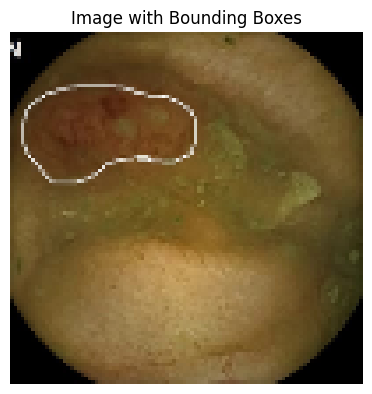

In [160]:
# Load your trained model
loaded_model = keras.models.load_model("/kaggle/working/challenge.h5")

# Load and preprocess the image you want to visualize
image_path = "/kaggle/input/gidataset/gidata/Auto-WCEBleedGen Challenge Test Dataset/Test Dataset 1/A0006.png"  # Replace with the path to your image
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB format
image = cv2.resize(image, (100, 100))  # Resize to the model's input size

# Display the image with bounding boxes
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title("Image with Bounding Boxes")
plt.axis('off')

Normalize pixel values to [0, 1] and reshape if needed
image = image / 255.0  # Normalize pixel values to [0, 1]
input_image = image.reshape((1, 100, 100, 3))

# Make predictions using the loaded model
predictions = loaded_model.predict(input_image)

In [161]:

# Define the preprocess_and_predict function
def preprocess_and_predict(image, model):
    if image.shape != (100, 100, 3):
        raise ValueError("Image dimensions do not match the model's input size.")

    # If your model requires a batch dimension, add it
    input_image = np.expand_dims(image, axis=0)

    # Make predictions using the loaded model
    predictions = model.predict(input_image)

    return predictions

# Load your trained model
loaded_model = keras.models.load_model("/kaggle/working/challenge.h5")

# Load the image you want to test
test_image_path = "/kaggle/input/gidataset/gidata/Auto-WCEBleedGen Challenge Test Dataset/Test Dataset 1/A0001.png"  # Replace with the actual path
test_image = cv2.imread(test_image_path)
test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)

# Resize the test image to match the expected input size (100x100 pixels)
test_image = cv2.resize(test_image, (100, 100))

# Call the preprocess_and_predict function
predictions = preprocess_and_predict(test_image, loaded_model)

# Print or examine the predictions
print(predictions)


1/1 [==============================] - 0s 67ms/step
[[1.0000000e+00 2.9484357e-10 0.0000000e+00 0.0000000e+00 0.0000000e+00
  0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00]]


1/1 [==============================] - 0s 65ms/step
[[1.0000000e+00 2.9484357e-10 0.0000000e+00 0.0000000e+00 0.0000000e+00
  0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00]]


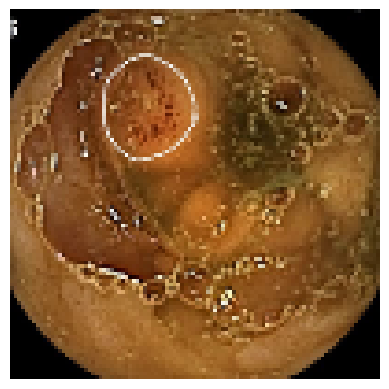

In [162]:
# Define the preprocess_and_predict function
def preprocess_and_predict(image, model):
    # Make sure the image matches the expected input shape of your model
    if image.shape != (100, 100, 3):
        raise ValueError("Image dimensions do not match the model's input size.")

    # If your model requires a batch dimension, add it
    input_image = np.expand_dims(image, axis=0)

    # Make predictions using the loaded model
    predictions = model.predict(input_image)
    return predictions

# Load your trained model
loaded_model = keras.models.load_model("/kaggle/working/challenge.h5")

# Load the image you want to test
test_image_path = "/kaggle/input/gidataset/gidata/Auto-WCEBleedGen Challenge Test Dataset/Test Dataset 1/A0001.png"  # Replace with the actual path
test_image = cv2.imread(test_image_path)
test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)

# Resize the test image to match the expected input size (100x100 pixels)
test_image = cv2.resize(test_image, (100, 100))

# Call the preprocess_and_predict function
predictions = preprocess_and_predict(test_image, loaded_model)

# Print or examine the predictions
print(predictions)

# Display the resized test image
plt.imshow(test_image)
plt.axis('off')  # Hide axis labels
plt.show()


1/1 [==============================] - 0s 70ms/step
[[1.37744225e-08 1.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00]]


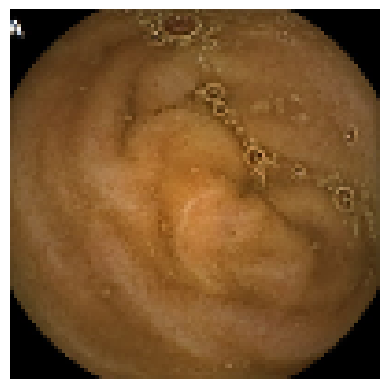

In [163]:
# Define the preprocess_and_predict function
def preprocess_and_predict(image, model):
    # Make sure the image matches the expected input shape of your model
    if image.shape != (100, 100, 3):
        raise ValueError("Image dimensions do not match the model's input size.")

    # If your model requires a batch dimension, add it
    input_image = np.expand_dims(image, axis=0)

    # Make predictions using the loaded model
    predictions = model.predict(input_image)
    return predictions

# Load your trained model
loaded_model = keras.models.load_model("/kaggle/working/challenge.h5")

# Load the image you want to test
test_image_path = "/kaggle/input/gidataset/gidata/Auto-WCEBleedGen Challenge Test Dataset/Test Dataset 2/A0056.png"  # Replace with the actual path
test_image = cv2.imread(test_image_path)
test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)

# Resize the test image to match the expected input size (100x100 pixels)
test_image = cv2.resize(test_image, (100, 100))

# Call the preprocess_and_predict function
predictions = preprocess_and_predict(test_image, loaded_model)

# Print or examine the predictions
print(predictions)

# Display the resized test image
plt.imshow(test_image)
plt.axis('off')  # Hide axis labels
plt.show()


In [164]:
def extract_bbox_from_prediction(prediction):
    # Extract bounding box coordinates (x1, y1, x2, y2) from the prediction
    x1, y1, x2, y2, *_ = prediction  
    return x1, y1, x2, y2


In [167]:
import os
import cv2
import numpy as np
from tensorflow.keras.models import load_model

# Load your pre-trained CNN model in .h5 format
model = load_model('/kaggle/working/challenge.h5')

# Define the folders containing your test datasets
test_dataset_folder_1 = '/kaggle/input/gidataset/gidata/Auto-WCEBleedGen Challenge Test Dataset/Test Dataset 1'
test_dataset_folder_2 = '/kaggle/input/gidataset/gidata/Auto-WCEBleedGen Challenge Test Dataset/Test Dataset 2'

# Define the output folders for each test dataset
output_folder_1 = 'output_folder_test_1/'
output_folder_2 = 'output_folder_test_2/'

# Create the output folders if they don't exist
if not os.path.exists(output_folder_1):
    os.makedirs(output_folder_1)

if not os.path.exists(output_folder_2):
    os.makedirs(output_folder_2)

def perform_object_detection(image_path, model):
    # Load the image
    image = cv2.imread(image_path)
    
    # Resize the image to match the model's expected input shape (100x100)
    image = cv2.resize(image, (100, 100))
    
    # Make a single prediction for the image
    prediction = model.predict(np.expand_dims(image, axis=0))
    
    # Ensure that a prediction was made
    if len(prediction) > 0:
        # Find the class with the highest confidence score
        class_index = np.argmax(prediction[0])
        
        # Extract the confidence score for the predicted class
        confidence = prediction[0][class_index]  # Fix here
        
        # Get the class label based on the class index (replace with your class labels)
        class_labels = ["Bleeding", "Non-Bleeding"]  # Replace with your class labels
        class_label = class_labels[class_index]
        
        # Get the bounding box coordinates (you need to adapt this based on your model's output)
        # This assumes that your model's output includes bounding box coordinates.
        x1, y1, x2, y2 = extract_bbox_from_prediction(prediction[0])  # Implement this function
        
        # Draw a bounding box
        cv2.rectangle(image, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
        
        # Add class label and confidence score
        cv2.putText(image, f'Class: {class_label}, Confidence: {confidence:.2f}', (int(x1), int(y1) - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    
    return image  

# Function to process a test dataset folder and save results
def process_test_dataset(test_dataset_folder, output_folder):
    for filename in os.listdir(test_dataset_folder):
        if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
            image_path = os.path.join(test_dataset_folder, filename)
            output_image = perform_object_detection(image_path, model)

            # Save the output image with bounding boxes
            output_image_path = os.path.join(output_folder, filename)
            cv2.imwrite(output_image_path, output_image)
            print(f'Results saved to {output_image_path}')

# Process Test Dataset 1
process_test_dataset(test_dataset_folder_1, output_folder_1)

# Process Test Dataset 2
process_test_dataset(test_dataset_folder_2, output_folder_2)


1/1 [==============================] - 0s 68ms/step
Results saved to output_folder_test_1/A0028.png
1/1 [==============================] - 0s 22ms/step
Results saved to output_folder_test_1/A0016.png
1/1 [==============================] - 0s 21ms/step
Results saved to output_folder_test_1/A0046.png
1/1 [==============================] - 0s 22ms/step
Results saved to output_folder_test_1/A0041.png
1/1 [==============================] - 0s 22ms/step
Results saved to output_folder_test_1/A0023.png
1/1 [==============================] - 0s 23ms/step
Results saved to output_folder_test_1/A0042.png
1/1 [==============================] - 0s 22ms/step
Results saved to output_folder_test_1/A0038.png
1/1 [==============================] - 0s 22ms/step
Results saved to output_folder_test_1/A0007.png
1/1 [==============================] - 0s 21ms/step
Results saved to output_folder_test_1/A0044.png
1/1 [==============================] - 0s 22ms/step
Results saved to output_folder_test_1/A0002.png


In [168]:
from IPython.display import Image, display
import os

# Path to the output folders
output_folder_1 = '/kaggle/working/output_folder_test_1'
output_folder_2 = '/kaggle/working/output_folder_test_2'

# List the files in output_folder_test_1
files_output_folder_1 = os.listdir(output_folder_1)

# List the files in output_folder_test_2
files_output_folder_2 = os.listdir(output_folder_2)

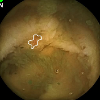

Image filename: A0004.png


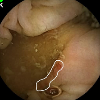

Image filename: A0049.png


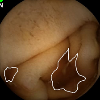

Image filename: A0011.png


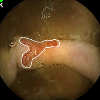

Image filename: A0046.png


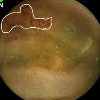

Image filename: A0021.png


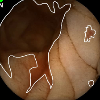

Image filename: A0031.png


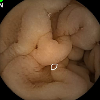

Image filename: A0018.png


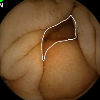

Image filename: A0013.png


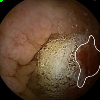

Image filename: A0041.png


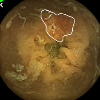

Image filename: A0009.png


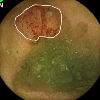

Image filename: A0026.png


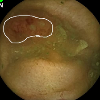

Image filename: A0006.png


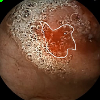

Image filename: A0038.png


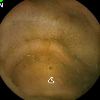

Image filename: A0030.png


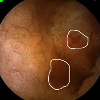

Image filename: A0043.png


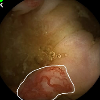

Image filename: A0047.png


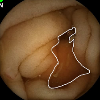

Image filename: A0012.png


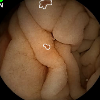

Image filename: A0024.png


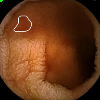

Image filename: A0034.png


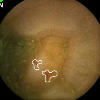

Image filename: A0005.png


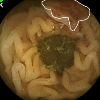

Image filename: A0008.png


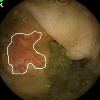

Image filename: A0044.png


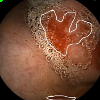

Image filename: A0039.png


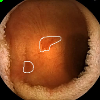

Image filename: A0033.png


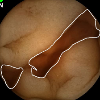

Image filename: A0010.png


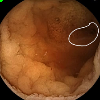

Image filename: A0002.png


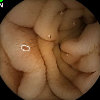

Image filename: A0019.png


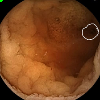

Image filename: A0000.png


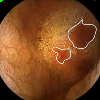

Image filename: A0042.png


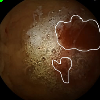

Image filename: A0040.png


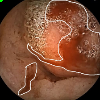

Image filename: A0037.png


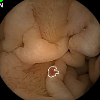

Image filename: A0017.png


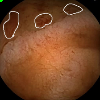

Image filename: A0035.png


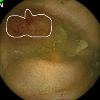

Image filename: A0020.png


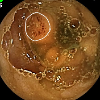

Image filename: A0001.png


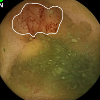

Image filename: A0027.png


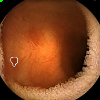

Image filename: A0032.png


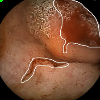

Image filename: A0036.png


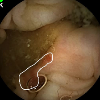

Image filename: A0048.png


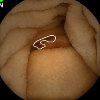

Image filename: A0014.png


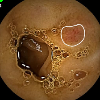

Image filename: A0003.png


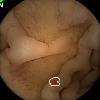

Image filename: A0016.png


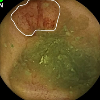

Image filename: A0025.png


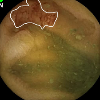

Image filename: A0028.png


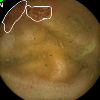

Image filename: A0022.png


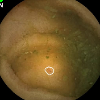

Image filename: A0029.png


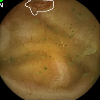

Image filename: A0023.png


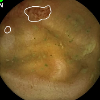

Image filename: A0007.png


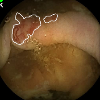

Image filename: A0045.png


In [169]:
from IPython.display import display, Image

# Define the output folder for Test Dataset 1
output_folder_1 = 'output_folder_test_1/'

# Get a list of filenames in the output folder
files_output_folder_1 = os.listdir(output_folder_1)

# Iterate through the files in the output folder
for filename in files_output_folder_1:

    image_path = os.path.join(output_folder_1, filename)
    
    # Display the filename along with the image
    display(Image(filename=image_path))
    print(f"Image filename: {filename}")


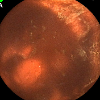

Image filename: A0142.png


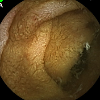

Image filename: A0306.png


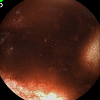

Image filename: A0366.png


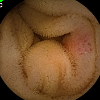

Image filename: A0327.png


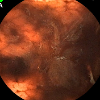

Image filename: A0294.png


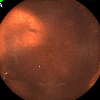

Image filename: A0149.png


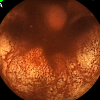

Image filename: A0257.png


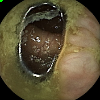

Image filename: A0465.png


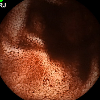

Image filename: A0473.png


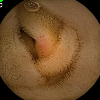

Image filename: A0328.png


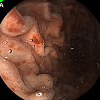

Image filename: A0065.png


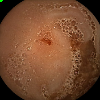

Image filename: A0401.png


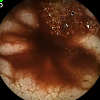

Image filename: A0365.png


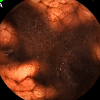

Image filename: A0200.png


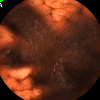

Image filename: A0201.png


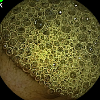

Image filename: A0518.png


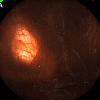

Image filename: A0169.png


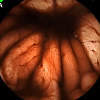

Image filename: A0193.png


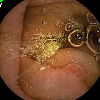

Image filename: A0558.png


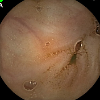

Image filename: A0301.png


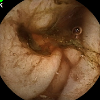

Image filename: A0506.png


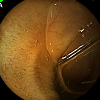

Image filename: A0120.png


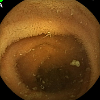

Image filename: A0093.png


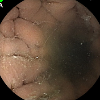

Image filename: A0304.png


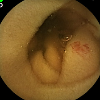

Image filename: A0336.png


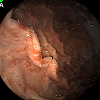

Image filename: A0062.png


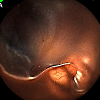

Image filename: A0165.png


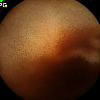

Image filename: A0447.png


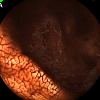

Image filename: A0158.png


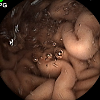

Image filename: A0442.png


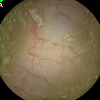

Image filename: A0310.png


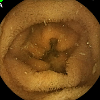

Image filename: A0101.png


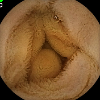

Image filename: A0331.png


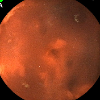

Image filename: A0138.png


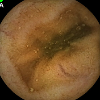

Image filename: A0055.png


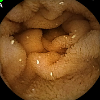

Image filename: A0079.png


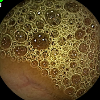

Image filename: A0488.png


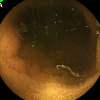

Image filename: A0225.png


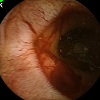

Image filename: A0499.png


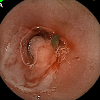

Image filename: A0300.png


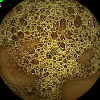

Image filename: A0321.png


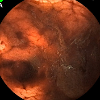

Image filename: A0189.png


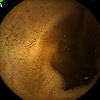

Image filename: A0119.png


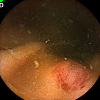

Image filename: A0427.png


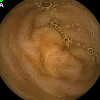

Image filename: A0056.png


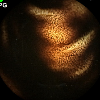

Image filename: A0453.png


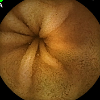

Image filename: A0125.png


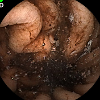

Image filename: A0379.png


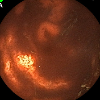

Image filename: A0264.png


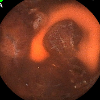

Image filename: A0160.png


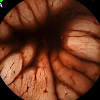

Image filename: A0194.png


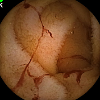

Image filename: A0498.png


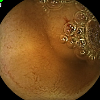

Image filename: A0486.png


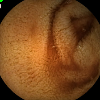

Image filename: A0438.png


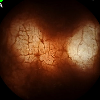

Image filename: A0148.png


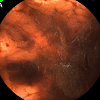

Image filename: A0186.png


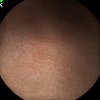

Image filename: A0491.png


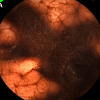

Image filename: A0197.png


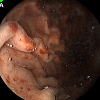

Image filename: A0064.png


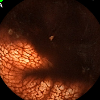

Image filename: A0292.png


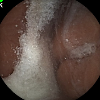

Image filename: A0495.png


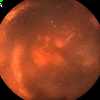

Image filename: A0139.png


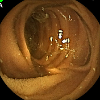

Image filename: A0087.png


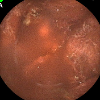

Image filename: A0271.png


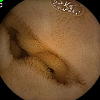

Image filename: A0326.png


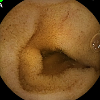

Image filename: A0108.png


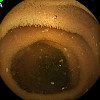

Image filename: A0089.png


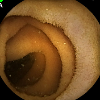

Image filename: A0085.png


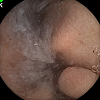

Image filename: A0494.png


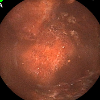

Image filename: A0159.png


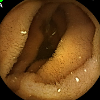

Image filename: A0082.png


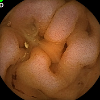

Image filename: A0386.png


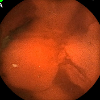

Image filename: A0246.png


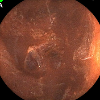

Image filename: A0168.png


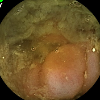

Image filename: A0564.png


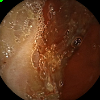

Image filename: A0393.png


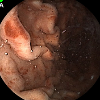

Image filename: A0066.png


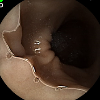

Image filename: A0374.png


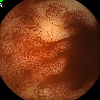

Image filename: A0144.png


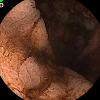

Image filename: A0384.png


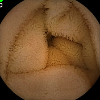

Image filename: A0330.png


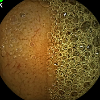

Image filename: A0517.png


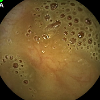

Image filename: A0074.png


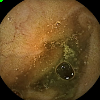

Image filename: A0459.png


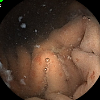

Image filename: A0317.png


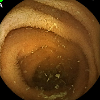

Image filename: A0219.png


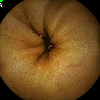

Image filename: A0118.png


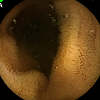

Image filename: A0115.png


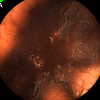

Image filename: A0274.png


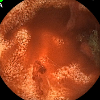

Image filename: A0268.png


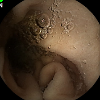

Image filename: A0541.png


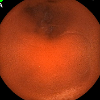

Image filename: A0147.png


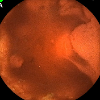

Image filename: A0249.png


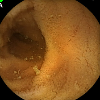

Image filename: A0094.png


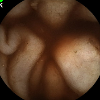

Image filename: A0508.png


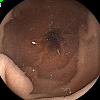

Image filename: A0478.png


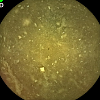

Image filename: A0430.png


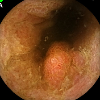

Image filename: A0233.png


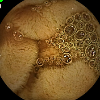

Image filename: A0432.png


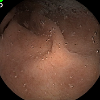

Image filename: A0341.png


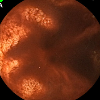

Image filename: A0291.png


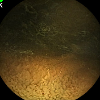

Image filename: A0520.png


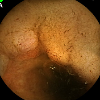

Image filename: A0226.png


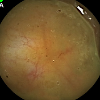

Image filename: A0072.png


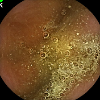

Image filename: A0496.png


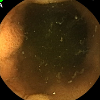

Image filename: A0124.png


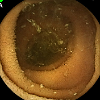

Image filename: A0086.png


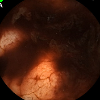

Image filename: A0179.png


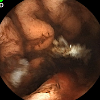

Image filename: A0385.png


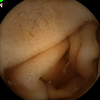

Image filename: A0548.png


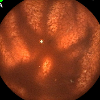

Image filename: A0259.png


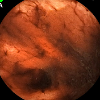

Image filename: A0191.png


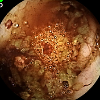

Image filename: A0360.png


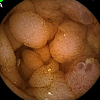

Image filename: A0212.png


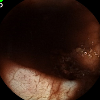

Image filename: A0364.png


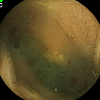

Image filename: A0334.png


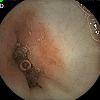

Image filename: A0415.png


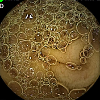

Image filename: A0416.png


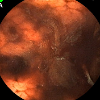

Image filename: A0184.png


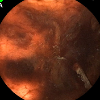

Image filename: A0181.png


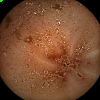

Image filename: A0406.png


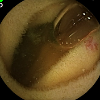

Image filename: A0335.png


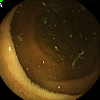

Image filename: A0084.png


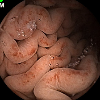

Image filename: A0532.png


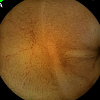

Image filename: A0222.png


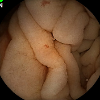

Image filename: A0543.png


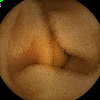

Image filename: A0318.png


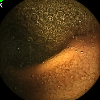

Image filename: A0521.png


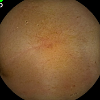

Image filename: A0344.png


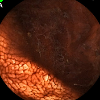

Image filename: A0156.png


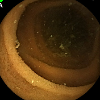

Image filename: A0218.png


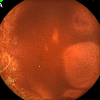

Image filename: A0253.png


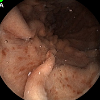

Image filename: A0052.png


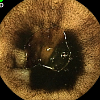

Image filename: A0387.png


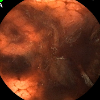

Image filename: A0183.png


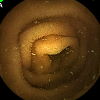

Image filename: A0105.png


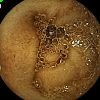

Image filename: A0436.png


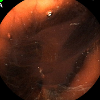

Image filename: A0275.png


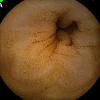

Image filename: A0114.png


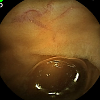

Image filename: A0338.png


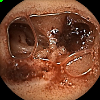

Image filename: A0409.png


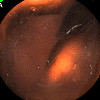

Image filename: A0170.png


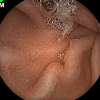

Image filename: A0530.png


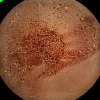

Image filename: A0405.png


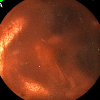

Image filename: A0263.png


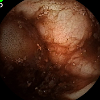

Image filename: A0349.png


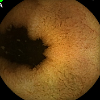

Image filename: A0121.png


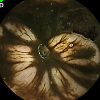

Image filename: A0391.png


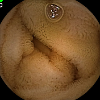

Image filename: A0325.png


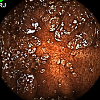

Image filename: A0474.png


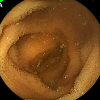

Image filename: A0092.png


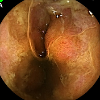

Image filename: A0126.png


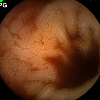

Image filename: A0446.png


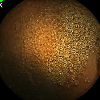

Image filename: A0524.png


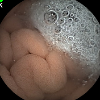

Image filename: A0511.png


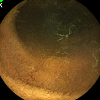

Image filename: A0519.png


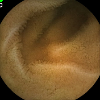

Image filename: A0332.png


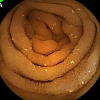

Image filename: A0216.png


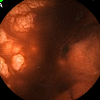

Image filename: A0137.png


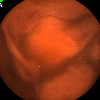

Image filename: A0255.png


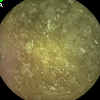

Image filename: A0309.png


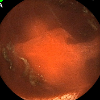

Image filename: A0143.png


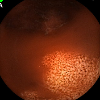

Image filename: A0269.png


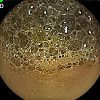

Image filename: A0419.png


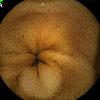

Image filename: A0104.png


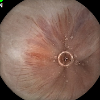

Image filename: A0540.png


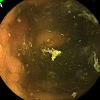

Image filename: A0240.png


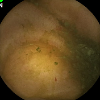

Image filename: A0552.png


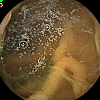

Image filename: A0343.png


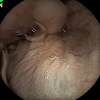

Image filename: A0538.png


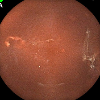

Image filename: A0166.png


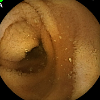

Image filename: A0278.png


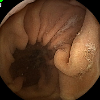

Image filename: A0479.png


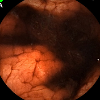

Image filename: A0196.png


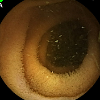

Image filename: A0090.png


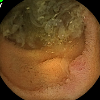

Image filename: A0563.png


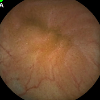

Image filename: A0057.png


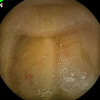

Image filename: A0549.png


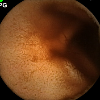

Image filename: A0452.png


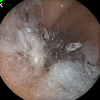

Image filename: A0493.png


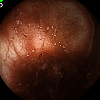

Image filename: A0355.png


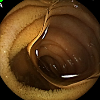

Image filename: A0083.png


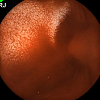

Image filename: A0469.png


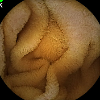

Image filename: A0513.png


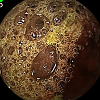

Image filename: A0359.png


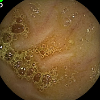

Image filename: A0358.png


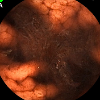

Image filename: A0202.png


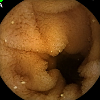

Image filename: A0214.png


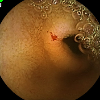

Image filename: A0484.png


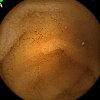

Image filename: A0091.png


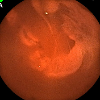

Image filename: A0251.png


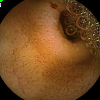

Image filename: A0485.png


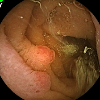

Image filename: A0560.png


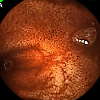

Image filename: A0136.png


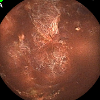

Image filename: A0164.png


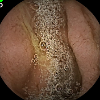

Image filename: A0342.png


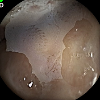

Image filename: A0422.png


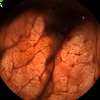

Image filename: A0195.png


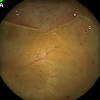

Image filename: A0059.png


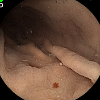

Image filename: A0371.png


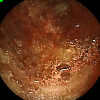

Image filename: A0394.png


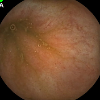

Image filename: A0058.png


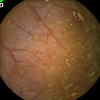

Image filename: A0429.png


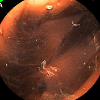

Image filename: A0173.png


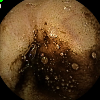

Image filename: A0439.png


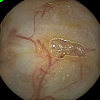

Image filename: A0462.png


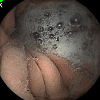

Image filename: A0510.png


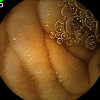

Image filename: A0378.png


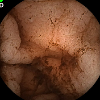

Image filename: A0382.png


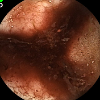

Image filename: A0350.png


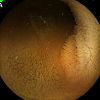

Image filename: A0223.png


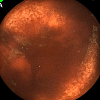

Image filename: A0141.png


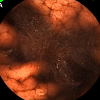

Image filename: A0277.png


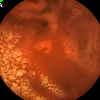

Image filename: A0250.png


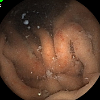

Image filename: A0315.png


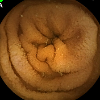

Image filename: A0220.png


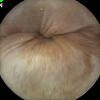

Image filename: A0539.png


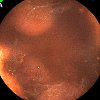

Image filename: A0151.png


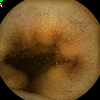

Image filename: A0099.png


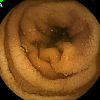

Image filename: A0106.png


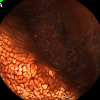

Image filename: A0155.png


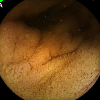

Image filename: A0122.png


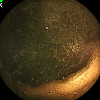

Image filename: A0522.png


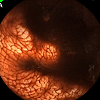

Image filename: A0152.png


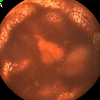

Image filename: A0266.png


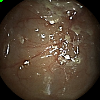

Image filename: A0464.png


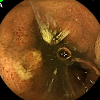

Image filename: A0238.png


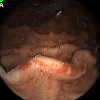

Image filename: A0050.png


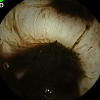

Image filename: A0390.png


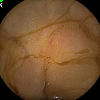

Image filename: A0504.png


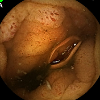

Image filename: A0235.png


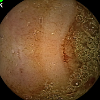

Image filename: A0501.png


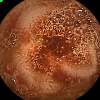

Image filename: A0396.png


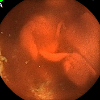

Image filename: A0289.png


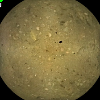

Image filename: A0490.png


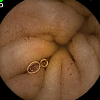

Image filename: A0376.png


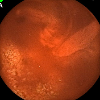

Image filename: A0252.png


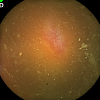

Image filename: A0431.png


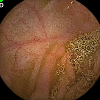

Image filename: A0428.png


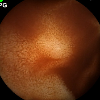

Image filename: A0448.png


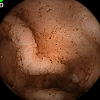

Image filename: A0381.png


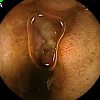

Image filename: A0229.png


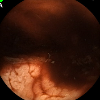

Image filename: A0177.png


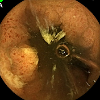

Image filename: A0239.png


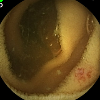

Image filename: A0337.png


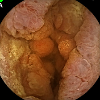

Image filename: A0210.png


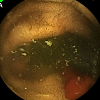

Image filename: A0241.png


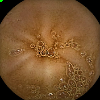

Image filename: A0456.png


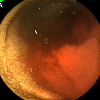

Image filename: A0245.png


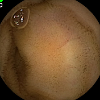

Image filename: A0324.png


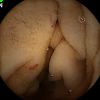

Image filename: A0545.png


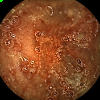

Image filename: A0395.png


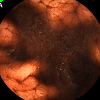

Image filename: A0199.png


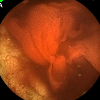

Image filename: A0288.png


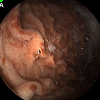

Image filename: A0063.png


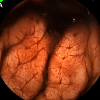

Image filename: A0295.png


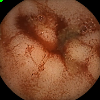

Image filename: A0399.png


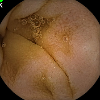

Image filename: A0512.png


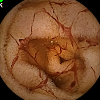

Image filename: A0497.png


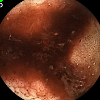

Image filename: A0351.png


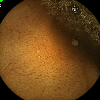

Image filename: A0320.png


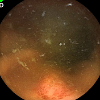

Image filename: A0426.png


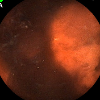

Image filename: A0161.png


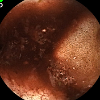

Image filename: A0352.png


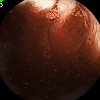

Image filename: A0369.png


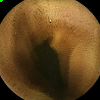

Image filename: A0458.png


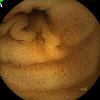

Image filename: A0110.png


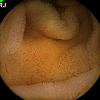

Image filename: A0466.png


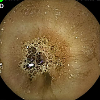

Image filename: A0421.png


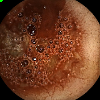

Image filename: A0400.png


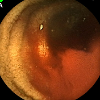

Image filename: A0244.png


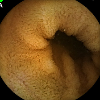

Image filename: A0117.png


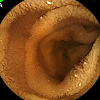

Image filename: A0213.png


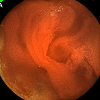

Image filename: A0130.png


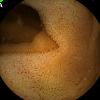

Image filename: A0088.png


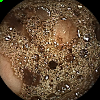

Image filename: A0411.png


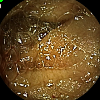

Image filename: A0434.png


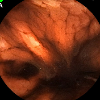

Image filename: A0192.png


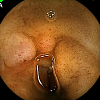

Image filename: A0228.png


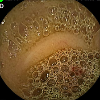

Image filename: A0418.png


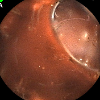

Image filename: A0272.png


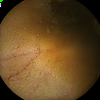

Image filename: A0489.png


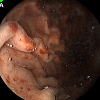

Image filename: A0051.png


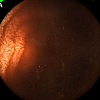

Image filename: A0262.png


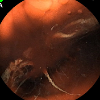

Image filename: A0176.png


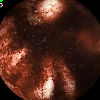

Image filename: A0370.png


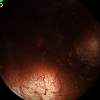

Image filename: A0353.png


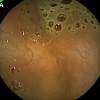

Image filename: A0075.png


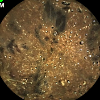

Image filename: A0537.png


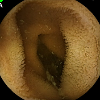

Image filename: A0102.png


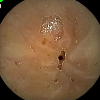

Image filename: A0441.png


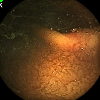

Image filename: A0523.png


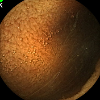

Image filename: A0525.png


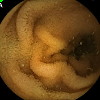

Image filename: A0100.png


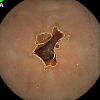

Image filename: A0071.png


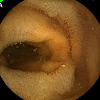

Image filename: A0095.png


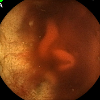

Image filename: A0247.png


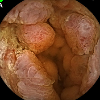

Image filename: A0209.png


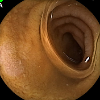

Image filename: A0076.png


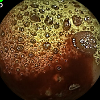

Image filename: A0345.png


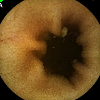

Image filename: A0224.png


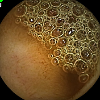

Image filename: A0487.png


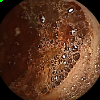

Image filename: A0402.png


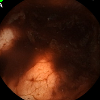

Image filename: A0178.png


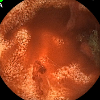

Image filename: A0145.png


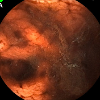

Image filename: A0188.png


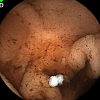

Image filename: A0380.png


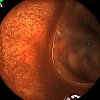

Image filename: A0135.png


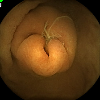

Image filename: A0481.png


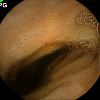

Image filename: A0443.png


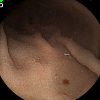

Image filename: A0373.png


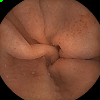

Image filename: A0454.png


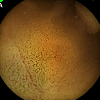

Image filename: A0221.png


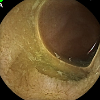

Image filename: A0307.png


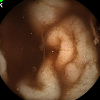

Image filename: A0509.png


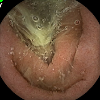

Image filename: A0555.png


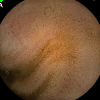

Image filename: A0302.png


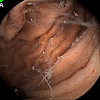

Image filename: A0053.png


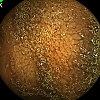

Image filename: A0526.png


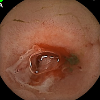

Image filename: A0299.png


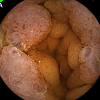

Image filename: A0207.png


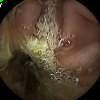

Image filename: A0553.png


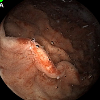

Image filename: A0061.png


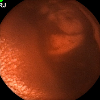

Image filename: A0470.png


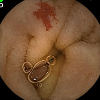

Image filename: A0375.png


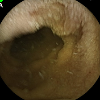

Image filename: A0305.png


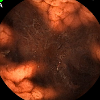

Image filename: A0203.png


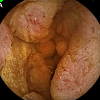

Image filename: A0211.png


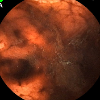

Image filename: A0190.png


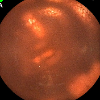

Image filename: A0265.png


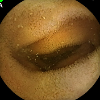

Image filename: A0096.png


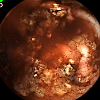

Image filename: A0362.png


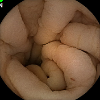

Image filename: A0542.png


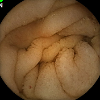

Image filename: A0546.png


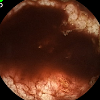

Image filename: A0363.png


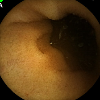

Image filename: A0112.png


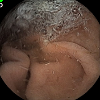

Image filename: A0340.png


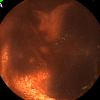

Image filename: A0140.png


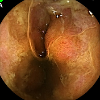

Image filename: A0230.png


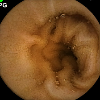

Image filename: A0444.png


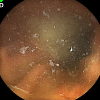

Image filename: A0423.png


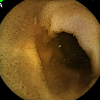

Image filename: A0111.png


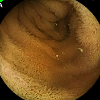

Image filename: A0113.png


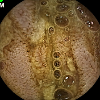

Image filename: A0535.png


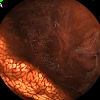

Image filename: A0157.png


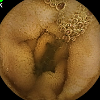

Image filename: A0515.png


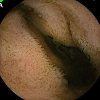

Image filename: A0303.png


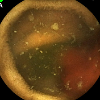

Image filename: A0284.png


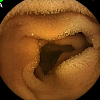

Image filename: A0080.png


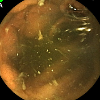

Image filename: A0282.png


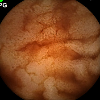

Image filename: A0450.png


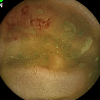

Image filename: A0550.png


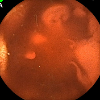

Image filename: A0290.png


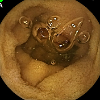

Image filename: A0107.png


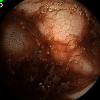

Image filename: A0348.png


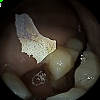

Image filename: A0477.png


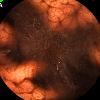

Image filename: A0204.png


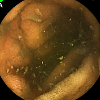

Image filename: A0127.png


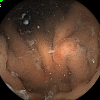

Image filename: A0316.png


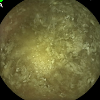

Image filename: A0308.png


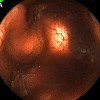

Image filename: A0175.png


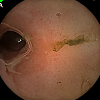

Image filename: A0297.png


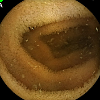

Image filename: A0098.png


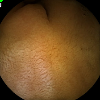

Image filename: A0480.png


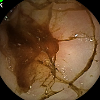

Image filename: A0505.png


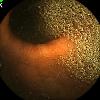

Image filename: A0528.png


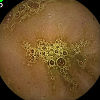

Image filename: A0356.png


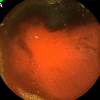

Image filename: A0243.png


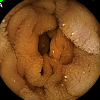

Image filename: A0078.png


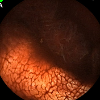

Image filename: A0153.png


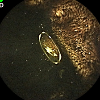

Image filename: A0388.png


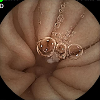

Image filename: A0414.png


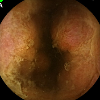

Image filename: A0231.png


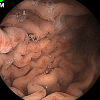

Image filename: A0531.png


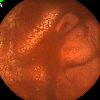

Image filename: A0254.png


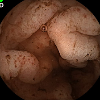

Image filename: A0383.png


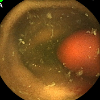

Image filename: A0242.png


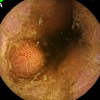

Image filename: A0232.png


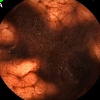

Image filename: A0198.png


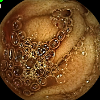

Image filename: A0435.png


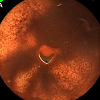

Image filename: A0260.png


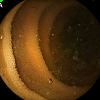

Image filename: A0217.png


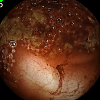

Image filename: A0361.png


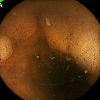

Image filename: A0227.png


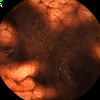

Image filename: A0296.png


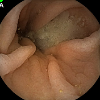

Image filename: A0070.png


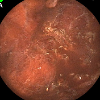

Image filename: A0293.png


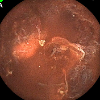

Image filename: A0163.png


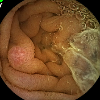

Image filename: A0559.png


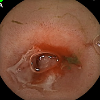

Image filename: A0298.png


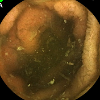

Image filename: A0281.png


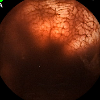

Image filename: A0167.png


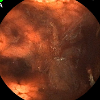

Image filename: A0185.png


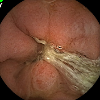

Image filename: A0554.png


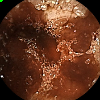

Image filename: A0410.png


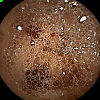

Image filename: A0403.png


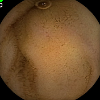

Image filename: A0323.png


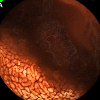

Image filename: A0154.png


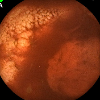

Image filename: A0133.png


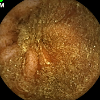

Image filename: A0536.png


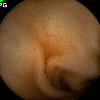

Image filename: A0445.png


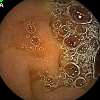

Image filename: A0054.png


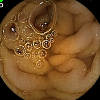

Image filename: A0377.png


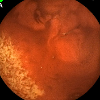

Image filename: A0131.png


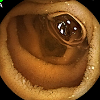

Image filename: A0081.png


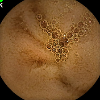

Image filename: A0502.png


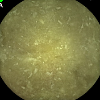

Image filename: A0311.png


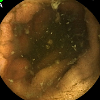

Image filename: A0128.png


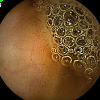

Image filename: A0483.png


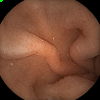

Image filename: A0455.png


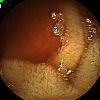

Image filename: A0433.png


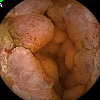

Image filename: A0208.png


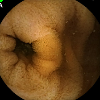

Image filename: A0279.png


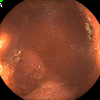

Image filename: A0150.png


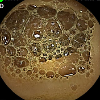

Image filename: A0417.png


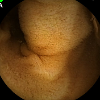

Image filename: A0116.png


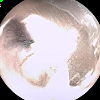

Image filename: A0312.png


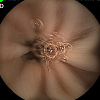

Image filename: A0412.png


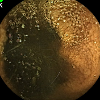

Image filename: A0527.png


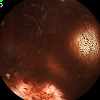

Image filename: A0354.png


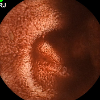

Image filename: A0472.png


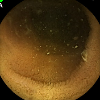

Image filename: A0109.png


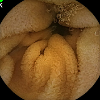

Image filename: A0514.png


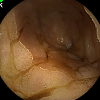

Image filename: A0503.png


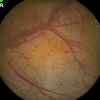

Image filename: A0073.png


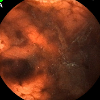

Image filename: A0187.png


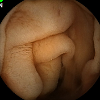

Image filename: A0544.png


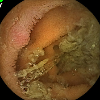

Image filename: A0562.png


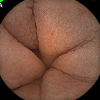

Image filename: A0206.png


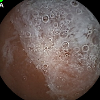

Image filename: A0069.png


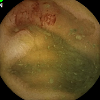

Image filename: A0551.png


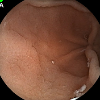

Image filename: A0068.png


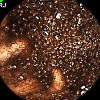

Image filename: A0475.png


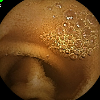

Image filename: A0319.png


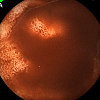

Image filename: A0146.png


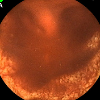

Image filename: A0134.png


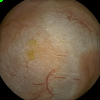

Image filename: A0460.png


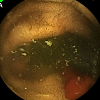

Image filename: A0283.png


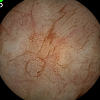

Image filename: A0347.png


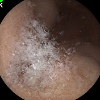

Image filename: A0492.png


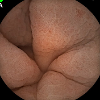

Image filename: A0205.png


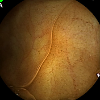

Image filename: A0280.png


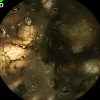

Image filename: A0389.png


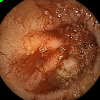

Image filename: A0397.png


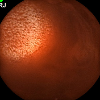

Image filename: A0468.png


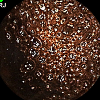

Image filename: A0476.png


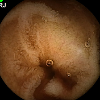

Image filename: A0467.png


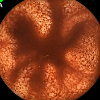

Image filename: A0267.png


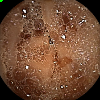

Image filename: A0404.png


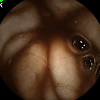

Image filename: A0507.png


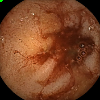

Image filename: A0398.png


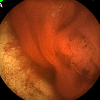

Image filename: A0287.png


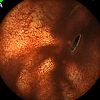

Image filename: A0261.png


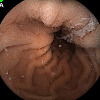

Image filename: A0067.png


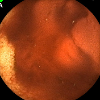

Image filename: A0248.png


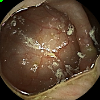

Image filename: A0463.png


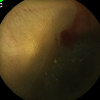

Image filename: A0333.png


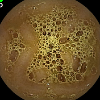

Image filename: A0357.png


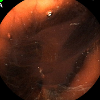

Image filename: A0174.png


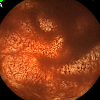

Image filename: A0256.png


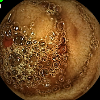

Image filename: A0437.png


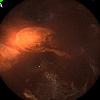

Image filename: A0273.png


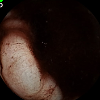

Image filename: A0367.png


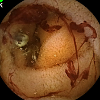

Image filename: A0500.png


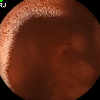

Image filename: A0471.png


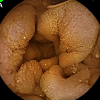

Image filename: A0077.png


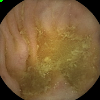

Image filename: A0461.png


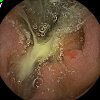

Image filename: A0556.png


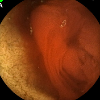

Image filename: A0286.png


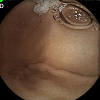

Image filename: A0413.png


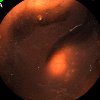

Image filename: A0171.png


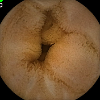

Image filename: A0329.png


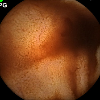

Image filename: A0451.png


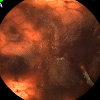

Image filename: A0276.png


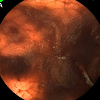

Image filename: A0182.png


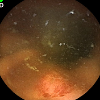

Image filename: A0425.png


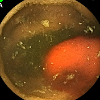

Image filename: A0129.png


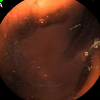

Image filename: A0172.png


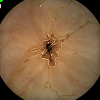

Image filename: A0440.png


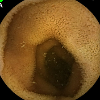

Image filename: A0103.png


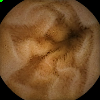

Image filename: A0457.png


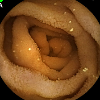

Image filename: A0215.png


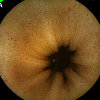

Image filename: A0123.png


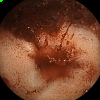

Image filename: A0408.png


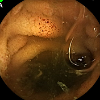

Image filename: A0234.png


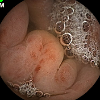

Image filename: A0533.png


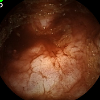

Image filename: A0346.png


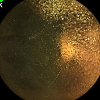

Image filename: A0529.png


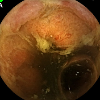

Image filename: A0237.png


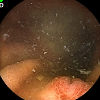

Image filename: A0424.png


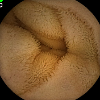

Image filename: A0322.png


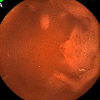

Image filename: A0132.png


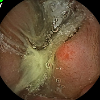

Image filename: A0557.png


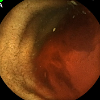

Image filename: A0285.png


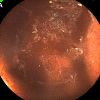

Image filename: A0162.png


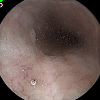

Image filename: A0339.png


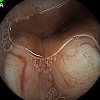

Image filename: A0060.png


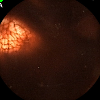

Image filename: A0270.png


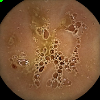

Image filename: A0392.png


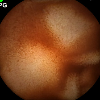

Image filename: A0449.png


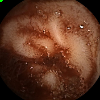

Image filename: A0407.png


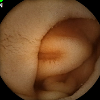

Image filename: A0547.png


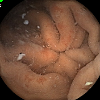

Image filename: A0314.png


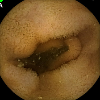

Image filename: A0097.png


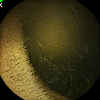

Image filename: A0516.png


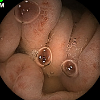

Image filename: A0534.png


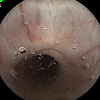

Image filename: A0313.png


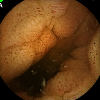

Image filename: A0236.png


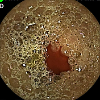

Image filename: A0420.png


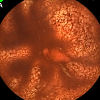

Image filename: A0258.png


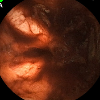

Image filename: A0180.png


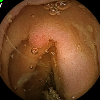

Image filename: A0561.png


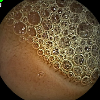

Image filename: A0482.png


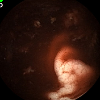

Image filename: A0368.png


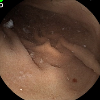

Image filename: A0372.png


In [170]:
from IPython.display import display, Image

# Define the output folder for Test Dataset 2
output_folder_2 = 'output_folder_test_2/'

# Get a list of filenames in the output folder
files_output_folder_2 = os.listdir(output_folder_2)

# Iterate through the files in the output folder
for filename in files_output_folder_2:
    image_path = os.path.join(output_folder_2, filename)
    
    # Display the filename along with the image
    display(Image(filename=image_path))
    print(f"Image filename: {filename}")


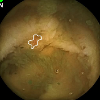

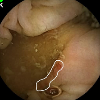

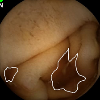

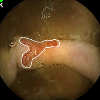

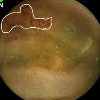

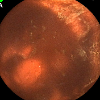

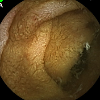

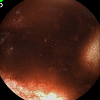

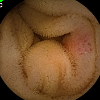

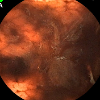

In [195]:
from IPython.display import Image, display
import os
import cv2

# Path to the output folders
output_folder_1 = '/kaggle/working/output_folder_test_1'
output_folder_2 = '/kaggle/working/output_folder_test_2'

# Function to extract confidence and filename from a filename
def get_confidence_and_filename(filename):
    parts = filename.split('_')
    if len(parts) >= 2:
        try:
            confidence = float(parts[1].split('.')[0])
            image_filename = parts[0] + '.png'
            return confidence, image_filename
        except ValueError:
            pass  # If the confidence score can't be converted to a float, ignore this filename
    return None, None  # Return None values if the filename doesn't match the expected format

# List the files in output_folder_test_1 and sort them by confidence
files_output_folder_1 = sorted(os.listdir(output_folder_1), key=get_confidence_and_filename, reverse=True)

# List the files in output_folder_test_2 and sort them by confidence
files_output_folder_2 = sorted(os.listdir(output_folder_2), key=get_confidence_and_filename, reverse=True)

# Initialize a counter for selecting the top 5 images
top_5_counter = 0

# Display the top 5 images from output_folder_test_1 with adjusted size
for filename in files_output_folder_1:
    if top_5_counter >= 5:
        break
    
    image_path = os.path.join(output_folder_1, filename)
    
    # Specify the desired width and height (e.g., width=400, height=300)
    display(Image(filename=image_path, width=400, height=300))
    
    top_5_counter += 1

# Reset the counter
top_5_counter = 0

# Display the top 5 images from output_folder_test_2 with adjusted size
for filename in files_output_folder_2:
    if top_5_counter >= 5:
        break
    
    image_path = os.path.join(output_folder_2, filename)
    
    # Specify the desired width and height (e.g., width=400, height=300)
    display(Image(filename=image_path, width=400, height=300))
    
    top_5_counter += 1


In [176]:
import os
import cv2
import numpy as np
from tensorflow.keras.models import load_model

# Load your pre-trained CNN model in .h5 format
model = load_model('/kaggle/working/challenge.h5')

# Path to the output folder
output_folder_2 = '/kaggle/working/output_folder_test_2'

# Function to extract predictions from an image
def extract_predictions(image_path, model):
    # Load the image
    image = cv2.imread(image_path)
    
    # Preprocess the image (adjust as needed)
    image = cv2.resize(image, (100, 100))
    image = image / 255.0  # Normalize pixel values to [0, 1]
    
    # Make predictions
    predictions = model.predict(np.expand_dims(image, axis=0))
    
    return predictions

# List the files in output_folder_test_2
files_output_folder_2 = sorted(os.listdir(output_folder_2))

# Process each image and extract predictions
for filename in files_output_folder_2:
    if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
        image_path = os.path.join(output_folder_2, filename)
        predictions = extract_predictions(image_path, model)
        
        # Get the predicted class label
        class_labels = ["Non-Bleeding", "Bleeding"]
        predicted_class_index = np.argmax(predictions)
        predicted_class_label = class_labels[predicted_class_index]
        
        # Print predictions including class label
        print(f"Predictions for {filename}:")
        print(f"Predicted Class Label: {predicted_class_label}")
        for prediction in predictions:
            # Assuming prediction format is a list of values
            print(f"Predicted Values: {prediction}")


1/1 [==============================] - 0s 72ms/step
Predictions for A0050.png:
Predicted Class Label: Non-Bleeding
Predicted Values: [9.3343782e-01 6.2231660e-02 3.5933715e-03 9.8595046e-06 4.8329269e-07
 1.2731919e-05 6.8932289e-04 5.3334952e-07 1.1235691e-06 2.3061320e-05]
1/1 [==============================] - 0s 24ms/step
Predictions for A0051.png:
Predicted Class Label: Non-Bleeding
Predicted Values: [9.9269718e-01 6.5614465e-03 4.2099858e-04 1.5845888e-05 7.6954996e-07
 7.5272550e-07 1.3019805e-06 2.0957843e-07 2.6338489e-09 3.0141056e-04]
1/1 [==============================] - 0s 22ms/step
Predictions for A0052.png:
Predicted Class Label: Non-Bleeding
Predicted Values: [9.6729380e-01 3.2146428e-02 2.3084295e-04 1.5488156e-05 1.5666041e-06
 2.4930623e-06 2.6181857e-05 3.2810885e-07 7.3584450e-09 2.8283769e-04]
1/1 [==============================] - 0s 22ms/step
Predictions for A0053.png:
Predicted Class Label: Non-Bleeding
Predicted Values: [9.9660826e-01 3.3896037e-03 1.8716818e

In [177]:
import os
import cv2
import numpy as np
import pandas as pd
from tensorflow.keras.models import load_model

# Load your pre-trained CNN model in .h5 format
model = load_model('/kaggle/working/challenge.h5')

# Define the folder containing your test dataset
test_dataset_folder = '/kaggle/input/gidataset/gidata/Auto-WCEBleedGen Challenge Test Dataset/Test Dataset 2'

# Create an output folder if it doesn't exist
output_folder = 'output_folder_test'
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# Initialize a list to store image information
image_info = []

def perform_object_detection(image_path, model, input_shape=(100, 100)):
    # Load the image
    image = cv2.imread(image_path)
    
    # Resize the image to the model's input shape
    image = cv2.resize(image, (input_shape[1], input_shape[0]))
    
    predictions = model.predict(np.expand_dims(image, axis=0))
    
    # Define your class labels (bleeding and non-bleeding)
    class_labels = ["Non-Bleeding", "Bleeding"]
    
    # Determine the predicted class based on confidence score
    predicted_label = class_labels[np.argmax(predictions)]
    
    # Extract bounding box coordinates and confidence level based on your prediction format
    if len(predictions[0]) >= 5:
        x1, y1, x2, y2, confidence = predictions[0][:5]  # Extract the first 5 values if available
    else:
        x1, y1, x2, y2, confidence = 0, 0, 0, 0, 0  # Default values if fewer than 5 values
    
    # Get image name from the image path
    image_name = os.path.basename(image_path)
    
    # Append image information to the list
    image_info.append([image_name, predicted_label, confidence])

# Process all images in the test dataset
for filename in os.listdir(test_dataset_folder):
    if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
        image_path = os.path.join(test_dataset_folder, filename)
        
        # Perform object detection and get image information
        perform_object_detection(image_path, model)

# Create a Pandas DataFrame from the collected image information
column_names = ["Image Name", "Predicted Class", "Confidence"]
df = pd.DataFrame(image_info, columns=column_names)

# Save the DataFrame to a CSV file
csv_file = 'predicted_results.csv'
df.to_csv(csv_file, index=False)

print(f"Predicted results saved to {csv_file}")


1/1 [==============================] - 0s 21ms/step
Predicted results saved to predicted_results.csv


In [180]:
def calculate_iou(box1, box2):
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    intersection_area = max(0, x2 - x1) * max(0, y2 - y1)
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])

    iou = intersection_area / float(box1_area + box2_area - intersection_area)
    return iou


In [192]:
def get_confidence(filename):
    # Split the filename using underscores
    parts = filename.split('_')
    
    if len(parts) < 2:
        return 0.0  # Default confidence score if format is not as expected
    
    # Extract confidence score from the second part (e.g., "confidence.png")
    confidence_part = parts[1]
    
    # Check if the part contains "confidence.png"
    if "confidence.png" not in confidence_part:
        return 0.0  # Default confidence score if "confidence.png" is not found
    
    # Extract the confidence score (remove "confidence.png" and convert to float)
    confidence_str = confidence_part.replace("confidence.png", "")
    
    try:
        confidence = float(confidence_str)
    except ValueError:
        confidence = 0.0  # Default confidence score if conversion fails
    
    return confidence


def evaluate_object_detection(predictions, ground_truth, iou_threshold=0.5):
    """
    Evaluate object detection predictions against ground truth annotations.

    Args:
        predictions (List[Tuple]): List of predicted bounding boxes (x1, y1, x2, y2, class_label).
        ground_truth (List[Tuple]): List of ground truth bounding boxes (x1, y1, x2, y2, class_label).
        iou_threshold (float): IoU threshold to consider a prediction as a true positive.

    Returns:
        float: Precision (TP / (TP + FP))
        float: Recall (TP / (TP + FN))
    """
    true_positives = 0
    false_positives = 0
    false_negatives = 0

    for prediction in predictions:
        prediction_bbox = prediction[:4]
        prediction_class = prediction[4]

        # Check if there's a ground truth annotation with the same class
        matching_ground_truth = [bbox for bbox in ground_truth if bbox[4] == prediction_class]

        if not matching_ground_truth:
            false_positives += 1
        else:
            # Calculate IoU with each matching ground truth annotation
            iou_values = [calculate_iou(prediction_bbox, bbox[:4]) for bbox in matching_ground_truth]

            # Get the maximum IoU among the matches
            max_iou = max(iou_values)

            if max_iou >= iou_threshold:
                true_positives += 1
                matching_ground_truth.pop(iou_values.index(max_iou))  # Remove matched ground truth
            else:
                false_positives += 1

    # Calculate false negatives (unmatched ground truth)
    false_negatives = len(ground_truth) - true_positives

    # Calculate precision and recall
    if (true_positives + false_positives) == 0:
        precision = 0.0
    else:
        precision = true_positives / (true_positives + false_positives)

    if (true_positives + false_negatives) == 0:
        recall = 0.0
    else:
        recall = true_positives / (true_positives + false_negatives)

    return precision, recall


# Define the output folders
output_folder_1 = '/kaggle/working/output_folder_test_1'
output_folder_2 = '/kaggle/working/output_folder_test_2'

# Initialize lists to store predictions and ground truth annotations
predictions_list = []
ground_truth_list = []

# Iterate through the output folders
for output_folder in [output_folder_1, output_folder_2]:
    files_output_folder = sorted(os.listdir(output_folder), key=get_confidence, reverse=True)
    
    # Process the files in the output folder
    for filename in files_output_folder:
        image_path = os.path.join(output_folder, filename)
        
        # Perform object detection and get predictions
        predictions = perform_object_detection(image_path, model)
        
        # Check if predictions are valid (not None)
        if predictions is not None:
            # Append predictions to the list
            predictions_list.extend(predictions)
    
    
    ground_truth_list_folder = [...]
    ground_truth_list.extend(ground_truth_list_folder)


precision, recall = evaluate_object_detection(predictions_list, ground_truth_list, iou_threshold=0.5)
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")


1/1 [==============================] - 0s 23ms/step
Precision: 0.00
Recall: 0.00


In [187]:
import os
import cv2
import numpy as np
import pandas as pd
from tensorflow.keras.models import load_model

# Load your pre-trained CNN model in .h5 format
model = load_model('/kaggle/working/challenge.h5')

# Define the folders containing your test datasets
test_dataset_folder_1 = '/kaggle/input/gidataset/gidata/Auto-WCEBleedGen Challenge Test Dataset/Test Dataset 1'
test_dataset_folder_2 = '/kaggle/input/gidataset/gidata/Auto-WCEBleedGen Challenge Test Dataset/Test Dataset 2'

# Create an output folder if it doesn't exist
output_folder = 'output_folder_test'
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# Initialize a list to store image information
image_info = []

def get_patient_id(image_name):
    # Extract the patient ID from the image name
    # You can implement this based on your naming convention
    # Example: Extract "P1" from "A0050.jpg"
    patient_id = image_name.split('_')[0]
    return patient_id

def perform_object_detection(image_path, model, input_shape=(100, 100)):
    # Load the image
    image = cv2.imread(image_path)
    
    # Resize the image to the model's input shape
    image = cv2.resize(image, (input_shape[1], input_shape[0]))
    
    predictions = model.predict(np.expand_dims(image, axis=0))
    
    # Define your class labels (bleeding and non-bleeding)
    class_labels = ["Non-Bleeding", "Bleeding"]
    
    # Define your confidence threshold for "Bleeding" predictions
    confidence_threshold = 0.2  

    # Determine the predicted class based on confidence score
    predicted_label = class_labels[np.argmax(predictions)]

    # Extract confidence level
    confidence = predictions[0][class_labels.index(predicted_label)]

    # Adjust the predicted label based on the confidence threshold
    if confidence >= confidence_threshold:
        predicted_label = "Bleeding"
    else:
        predicted_label = "Non-Bleeding"
    
    if len(predictions[0]) >= 5:
        x1, y1, x2, y2, confidence = predictions[0][:5]  # Extract the first 5 values if available
    else:
        x1, y1, x2, y2, confidence = 0, 0, 0, 0, 0  # Default values if fewer than 5 values
    
    # Get image name from the image path
    image_name = os.path.basename(image_path)
    
    # Extract patient ID from the image name
    patient_id = get_patient_id(image_name)
    
    # Append image information to the list
    image_info.append([image_name, patient_id, predicted_label, x1, y1, x2, y2, confidence])

# Process all images in Test Dataset 1
for filename in os.listdir(test_dataset_folder_1):
    if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
        image_path = os.path.join(test_dataset_folder_1, filename)
        
        # Perform object detection and get image information
        perform_object_detection(image_path, model)

# Process all images in Test Dataset 2
for filename in os.listdir(test_dataset_folder_2):
    if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
        image_path = os.path.join(test_dataset_folder_2, filename)
        
        # Perform object detection and get image information
        perform_object_detection(image_path, model)

# Create a Pandas DataFrame from the collected image information
column_names = ["Image Name", "Patient ID", "Predicted Class", "X1", "Y1", "X2", "Y2", "Confidence"]
df = pd.DataFrame(image_info, columns=column_names)

# Save the DataFrame to an Excel sheet
excel_file = 'predicted_results_with_patient_info_confidence-f.xlsx'
df.to_excel(excel_file, index=False)

print(f"Predicted results saved to {excel_file}")


1/1 [==============================] - 0s 24ms/step
Predicted results saved to predicted_results_with_patient_info_confidence-f.xlsx


In [190]:
import os
import cv2
import numpy as np
import pandas as pd
from tensorflow.keras.models import load_model

# Load your pre-trained CNN model in .h5 format
model = load_model('/kaggle/working/challenge.h5')

# Define the folders containing your test datasets
test_dataset_folder_1 = '/kaggle/working/output_folder_test_1'
test_dataset_folder_2 = '/kaggle/working/output_folder_test_2'

# Create an output folder if it doesn't exist
output_folder = 'output_folder_test'
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# Initialize a list to store image information
image_info = []

def get_patient_id(image_name):
    patient_id = image_name.split('_')[0]
    return patient_id

def perform_object_detection(image_path, model, input_shape=(100, 100)):
    # Load the image
    image = cv2.imread(image_path)
    
    # Resize the image to the model's input shape
    image = cv2.resize(image, (input_shape[1], input_shape[0]))
    
    predictions = model.predict(np.expand_dims(image, axis=0))
    
    # Define your class labels (bleeding and non-bleeding)
    class_labels = ["Non-Bleeding", "Bleeding"]
    
    # Define your confidence threshold for "Bleeding" predictions
    confidence_threshold = 0.2  

    # Determine the predicted class based on confidence score
    predicted_label = class_labels[np.argmax(predictions)]

    # Extract confidence level
    confidence = predictions[0][class_labels.index(predicted_label)]

    # Adjust the predicted label based on the confidence threshold
    if confidence >= confidence_threshold:
        predicted_label = "Bleeding"
    else:
        predicted_label = "Non-Bleeding"
    
    # Extract bounding box coordinates and confidence level 
    if len(predictions[0]) >= 5:
        x1, y1, x2, y2, confidence = predictions[0][:5]  # Extract the first 5 values if available
    else:
        x1, y1, x2, y2, confidence = 0, 0, 0, 0, 0  # Default values if fewer than 5 values
    
    # Get image name from the image path
    image_name = os.path.basename(image_path)
    
    # Extract patient ID from the image name
    patient_id = get_patient_id(image_name)
    
    # Append image information to the list
    image_info.append([image_name, patient_id, predicted_label, x1, y1, x2, y2, confidence])

# Process all images in Test Dataset 1
for filename in os.listdir(test_dataset_folder_1):
    if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
        image_path = os.path.join(test_dataset_folder_1, filename)
        
        # Perform object detection and get image information
        perform_object_detection(image_path, model)

# Process all images in Test Dataset 2
for filename in os.listdir(test_dataset_folder_2):
    if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
        image_path = os.path.join(test_dataset_folder_2, filename)
        
        # Perform object detection and get image information
        perform_object_detection(image_path, model)

# Create a Pandas DataFrame from the collected image information
column_names = ["Image Name", "Patient ID", "Predicted Class", "X1", "Y1", "X2", "Y2", "Confidence"]
df = pd.DataFrame(image_info, columns=column_names)

# Save the DataFrame to an Excel sheet
excel_file = 'predicted_results_with_patient_info_confidence_output.xlsx'
df.to_excel(excel_file, index=False)

print(f"Predicted results saved to {excel_file}")


1/1 [==============================] - 0s 25ms/step
Predicted results saved to predicted_results_with_patient_info_confidence_output.xlsx


In [193]:
import os
import cv2
import numpy as np
from tensorflow.keras.models import load_model
import shutil

# Load your pre-trained CNN model in .h5 format
model = load_model('/kaggle/working/challenge.h5')

# Function to extract predictions from an image
def extract_predictions(image_path, model):
    # Load the image
    image = cv2.imread(image_path)
    
    # Preprocess the image (adjust as needed)
    image = cv2.resize(image, (100, 100))
    image = image / 255.0  # Normalize pixel values to [0, 1]
    
    # Make predictions
    predictions = model.predict(np.expand_dims(image, axis=0))
    
    return predictions

# Modify the perform_object_detection function
def perform_object_detection(image_path, model, output_image_path, output_folder_bleeding, output_folder_non_bleeding):
    # Extract predictions from the image
    predictions = extract_predictions(image_path, model)
    
    # Define your class labels (bleeding and non-bleeding)
    class_labels = ["Non-Bleeding", "Bleeding"]
    
    # Use the bounding box files to categorize the image
    bounding_box_file_path = get_corresponding_bounding_box_file(image_path)
    
    if is_bleeding(bounding_box_file_path):
        # Copy the image to the "Bleeding" folder
        shutil.copy(image_path, os.path.join(output_folder_bleeding, f"bbox_{filename}"))
    else:
        # Copy the image to the "Non-Bleeding" folder
        shutil.copy(image_path, os.path.join(output_folder_non_bleeding, f"bbox_{filename}"))

# Function to get the corresponding bounding box file path
def get_corresponding_bounding_box_file(image_path):
    # Implement this function to get the path of the bounding box file corresponding to the image
    # You may need to match image filenames with bounding box filenames
    # Example: If image_path is '/path/to/images/A001.jpg', return '/path/to/bounding_boxes/A001.txt'
    pass

# Function to check if an image is bleeding based on bounding box information
def is_bleeding(bounding_box_file_path):
    # Implement this function to determine if an image is bleeding based on bounding box information
    # You may need to read the bounding box file and apply your criteria
    pass

# Define the output folders for both test datasets
output_folder_test_1 = '/kaggle/working/output_folder_test_1'
output_folder_test_2 = '/kaggle/working/output_folder_test_2'

# Create folders for "Bleeding" and "Non-Bleeding" images for test dataset 1
output_folder_bleeding_1 = '/kaggle/working/output_folder_bleeding_test_1'
output_folder_non_bleeding_1 = '/kaggle/working/output_folder_non_bleeding_test_1'

if not os.path.exists(output_folder_bleeding_1):
    os.makedirs(output_folder_bleeding_1)

if not os.path.exists(output_folder_non_bleeding_1):
    os.makedirs(output_folder_non_bleeding_1)

# Create folders for "Bleeding" and "Non-Bleeding" images for test dataset 2
output_folder_bleeding_2 = '/kaggle/working/output_folder_bleeding_test_2'
output_folder_non_bleeding_2 = '/kaggle/working/output_folder_non_bleeding_test_2'

if not os.path.exists(output_folder_bleeding_2):
    os.makedirs(output_folder_bleeding_2)

if not os.path.exists(output_folder_non_bleeding_2):
    os.makedirs(output_folder_non_bleeding_2)

# List the files in output_folder_test_1
files_output_folder_test_1 = sorted(os.listdir(output_folder_test_1))

# Process each image in test dataset 1 and categorize them
for filename in files_output_folder_test_1:
    if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
        image_path = os.path.join(output_folder_test_1, filename)
        output_image_path = os.path.join(output_folder_test_1, f"bbox_{filename}")
        
        # Perform object detection and categorize the image
        perform_object_detection(image_path, model, output_image_path, output_folder_bleeding_1, output_folder_non_bleeding_1)

# List the files in output_folder_test_2
files_output_folder_test_2 = sorted(os.listdir(output_folder_test_2))

# Process each image in test dataset 2 and categorize them
for filename in files_output_folder_test_2:
    if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
        image_path = os.path.join(output_folder_test_2, filename)
        output_image_path = os.path.join(output_folder_test_2, f"bbox_{filename}")
        
        # Perform object detection and categorize the image
        perform_object_detection(image_path, model, output_image_path, output_folder_bleeding_2, output_folder_non_bleeding_2)


1/1 [==============================] - 0s 28ms/step


In [199]:
import numpy as np

# Binary Classification Metrics
def calculate_binary_classification_metrics(y_true, y_pred):
    """
    Calculate TP, TN, FP, FN for binary classification.
    
    Args:
        y_true (array-like): True labels (ground truth).
        y_pred (array-like): Predicted labels.

    Returns:
        int: True Positives (TP)
        int: True Negatives (TN)
        int: False Positives (FP)
        int: False Negatives (FN)
    """
    assert len(y_true) == len(y_pred), "Input arrays must have the same length."

    TP = sum((y_true == 1) & (y_pred == 1))
    TN = sum((y_true == 0) & (y_pred == 0))
    FP = sum((y_true == 0) & (y_pred == 1))
    FN = sum((y_true == 1) & (y_pred == 0))

    return TP, TN, FP, FN

# Object Detection Metrics
def calculate_iou(box1, box2):
    """
    Calculate Intersection over Union (IoU) between two bounding boxes.

    Args:
        box1 (tuple): Bounding box coordinates (x1, y1, x2, y2).
        box2 (tuple): Bounding box coordinates (x1, y1, x2, y2).

    Returns:
        float: Intersection over Union (IoU) score.
    """
    x1_1, y1_1, x2_1, y2_1 = box1
    x1_2, y1_2, x2_2, y2_2 = box2

    # Calculate intersection coordinates
    x1i = max(x1_1, x1_2)
    y1i = max(y1_1, y1_2)
    x2i = min(x2_1, x2_2)
    y2i = min(y2_1, y2_2)

    # Calculate area of intersection
    intersection_area = max(0, x2i - x1i) * max(0, y2i - y1i)

    # Calculate area of individual boxes
    box1_area = (x2_1 - x1_1) * (y2_1 - y1_1)
    box2_area = (x2_2 - x1_2) * (y2_2 - y1_2)

    # Calculate IoU
    iou = intersection_area / float(box1_area + box2_area - intersection_area)

    return iou

def calculate_mean_average_precision(ground_truths, predictions, iou_threshold=0.5):
    """
    Calculate Mean Average Precision (mAP) for object detection.

    Args:
        ground_truths (list): List of ground truth bounding boxes (x1, y1, x2, y2).
        predictions (list): List of predicted bounding boxes (x1, y1, x2, y2).
        iou_threshold (float): IoU threshold for considering a prediction as correct.

    Returns:
        float: Mean Average Precision (mAP) score.
    """
    assert len(ground_truths) == len(predictions), "Number of ground truth and prediction samples must match."

    num_classes = len(ground_truths)
    ap_values = []

    for class_index in range(num_classes):
        true_positives = 0
        false_positives = 0
        num_gt_boxes = len(ground_truths[class_index])

        if num_gt_boxes == 0:
            continue

        confidence_scores = [box[4] for box in predictions[class_index]]
        sorted_indices = np.argsort(confidence_scores)[::-1]
        sorted_predictions = [predictions[class_index][i] for i in sorted_indices]

        for prediction in sorted_predictions:
            iou_scores = [calculate_iou(prediction[:4], gt[:4]) for gt in ground_truths[class_index]]
            max_iou = max(iou_scores)

            if max_iou >= iou_threshold:
                true_positives += 1
            else:
                false_positives += 1

            precision = true_positives / (true_positives + false_positives)
            recall = true_positives / num_gt_boxes

            ap_values.append(precision)

    return np.mean(ap_values)

# Example usage for binary classification metrics:
y_true = np.array([1, 0, 1, 0, 1])
y_pred = np.array([1, 0, 0, 1, 1])

TP, TN, FP, FN = calculate_binary_classification_metrics(y_true, y_pred)
print(f"True Positives: {TP}")
print(f"True Negatives: {TN}")
print(f"False Positives: {FP}")
print(f"False Negatives: {FN}")

ground_truths = [
    [(100, 100, 200, 200), (300, 300, 400, 400)],  # Ground truth boxes for class 0
    [(150, 150, 250, 250)]  # Ground truth boxes for class 1
]

predictions = [
    [(90, 90, 210, 210, 0, 0.9), (305, 305, 405, 405, 0, 0.8)],  # Predicted boxes for class 0
    [(160, 160, 240, 240, 1, 0.95)]  # Predicted boxes for class 1
]

iou_threshold = 0.5
mAP = calculate_mean_average_precision(ground_truths, predictions, iou_threshold)
print(f"Mean Average Precision (mAP): {mAP:.2f}")


True Positives: 2
True Negatives: 1
False Positives: 1
False Negatives: 1
Mean Average Precision (mAP): 1.00


In [204]:
# Import necessary libraries
import numpy as np

# Define functions to calculate evaluation metrics

def calculate_accuracy(TP, TN, FP, FN):
    return (TP + TN) / (TP + TN + FP + FN)

def calculate_recall(TP, FN):
    return TP / (TP + FN)

def calculate_f1_score(TP, FP, FN):
    precision = TP / (TP + FP)
    recall = TP / (TP + FN)
    return (2 * precision * recall) / (precision + recall)

def calculate_iou(ground_truth, prediction):
    # Calculate intersection and union areas
    intersection = np.logical_and(ground_truth, prediction)
    union = np.logical_or(ground_truth, prediction)
    iou = np.sum(intersection) / np.sum(union)
    return iou

def calculate_average_precision(ground_truth, prediction, iou_threshold=0.5):
    # Calculate precision and recall
    true_positives = np.logical_and(ground_truth, prediction)
    false_positives = np.logical_and(np.logical_not(ground_truth), prediction)
    true_negatives = np.logical_and(np.logical_not(ground_truth), np.logical_not(prediction))
    false_negatives = np.logical_and(ground_truth, np.logical_not(prediction))

    precision = np.sum(true_positives) / (np.sum(true_positives) + np.sum(false_positives))
    recall = np.sum(true_positives) / (np.sum(true_positives) + np.sum(false_negatives))

    # Calculate AP at a specific IoU threshold
    if recall == 0:
        return 0
    else:
        return precision

def calculate_mean_average_precision(ground_truths, predictions, iou_threshold=0.5):
    num_classes = len(ground_truths)
    ap_values = []

    for class_index in range(num_classes):
        ap = calculate_average_precision(ground_truths[class_index], predictions[class_index], iou_threshold)
        ap_values.append(ap)

    return sum(ap_values) / num_classes
TP = 100
TN = 50
FP = 10
FN = 5
accuracy = calculate_accuracy(TP, TN, FP, FN)
recall = calculate_recall(TP, FN)
f1_score = calculate_f1_score(TP, FP, FN)

ground_truth = np.array([[0, 1, 0], [1, 1, 1], [0, 1, 0]])
prediction = np.array([[0, 0, 1], [0, 1, 1], [0, 0, 0]])

iou = calculate_iou(ground_truth, prediction)

ground_truths = [ground_truth]
predictions = [prediction]

mAP = calculate_mean_average_precision(ground_truths, predictions)

print(f"Accuracy: {accuracy:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1_score:.2f}")
print(f"IoU: {iou:.2f}")
print(f"mAP: {mAP:.2f}")


Accuracy: 0.91
Recall: 0.95
F1 Score: 0.93
IoU: 0.33
mAP: 0.67
